In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


import plotly.io as pio; pio.renderers.default = 'notebook'
import plotly.express as px


import warnings; warnings.filterwarnings('ignore')


In [116]:
df = pd.read_csv('owid-covid-data.csv')
pd.set_option('display.max_columns', 85)


In [117]:

starting_point = df[df.location=='China'].date.iloc[0]
df = df[df.date > starting_point]


df_worldwide = df[~df.continent.notnull()]
df = df[df.continent.notnull()]
df = df.sort_values(by='date')


# General 

first things first, some data cleaning must be done
seems like the data is indexed by country + date meaning there is as much rows as there are countries for each day
we can do either multindexing the frame or just groupby it by date and country and with each frame do related analysis 

- the location had not just the countries by the continents too, which should be the mean values of all the countries in the continent
- there are quite bit of missing values in some features though most of them relate to some specefic countries which we dont have enough info on
  so one thing we can do is that in the analysis we use only a handfull amount of them (except for the map-wide analytics)



# What we'll see .. 



**Part 1:**
- we'll see cases/deaths/moratality visualizations
- we'll have a wave counting algorithm to analyz the waves of each country/continent
- and we'll have chornological analysis of how different time period(eg seasons, months, days of week) affect the cases/death



**Part 2:**
- we'll work with country specefic features(those who have a single value for each country in all the time frames)
  some of them are :
    - human_development_index
    - life_expectancy
    - population_density
    - etc...
    

**Part 3:**
- as we will see later, China was very much seccusful in dealing with the outbreak, we'll try to investigate why and how (not a fan of illuminati shit and all but very sus, very sus indeed...)




**Part 4:**
- we'll add and work with some additional data taken from owid.com and try to make some sense out of them 
  containing these datasets  
    - tempreture
    - mental health
    - addictions
    - smoking 
    
    



Yet to be investigated : 
- https://github.com/owid/covid-19-data/tree/master/public/data



- icu and hospitalization effect over cured cases (over a period of time like 7 or 14 dayz)
  and role of new addmissions to ICU ? 
  
- [new data] detailed restrictions here : https://ourworldindata.org/policy-responses-covid

- fatality and mortality https://ourworldindata.org/mortality-risk-covid


we want to have only the countries to groupby our data with, so we'll drop other unique values which happends to have null in thei're continent feature and that would be our method to filter only countries...

# Part 1 
# 1 - How it all started!
below we'll see how the infection spreaded over the globe

after that we see how the virus spreaded over time in each continent

In [4]:
# change the projection to 'robinson' for more clear look 
fig = px.scatter_geo(df.sort_values(by='date'), locations="location", locationmode='country names', 
                     size= np.power(df.sort_values(by='date')["total_cases"].fillna(0)+1,0.4), 
                     color= df.sort_values(by='date')["total_deaths"].fillna(0), #projection="natural earth2",
                     animation_frame="date", range_color=(-5000, 20000), 
                     color_continuous_scale='reds', title='Spreading Progression of Corona Virus')

fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 1
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 1
fig.update_layout(autosize=False, width=1000, height=600, title_y=0.9, title_x=0.5, coloraxis_colorbar={'title':"Total Deaths"})
fig.show()

In [5]:
fig = px.area(df, x="date", y="total_cases", color="continent", line_group="location", title='Stacked Area Plot of Total Cases')
fig.show()

fig = px.area(df, x="date", y="new_cases_smoothed", color="continent", line_group="location", groupnorm='percent', title='Percentage Based Stacked Area Plot Of New Cases')
fig.show()


Here we see a chronological transformation of new cases and new deaths, each chart shows us a different base of time series to look at

In [6]:
import altair as alt


alt.data_transformers.disable_max_rows()

chrono_df = df.groupby('date')['new_deaths', 'new_cases', 'total_cases', 'total_deaths'].sum().reset_index()
chrono_df.date = pd.to_datetime(chrono_df.date, infer_datetime_format=True)

def not_a_very_general_func(col_name='new_cases', color='reds'):
    
    fig1 = alt.Chart(chrono_df).mark_rect().encode(
        alt.X('year(date):O', title='year'),
        alt.Y('month(date):O', title='month'),
        alt.Color('{0}:Q'.format(col_name), title=col_name, scale=alt.Scale(scheme=color)), 
        ).properties(title='2020 vs 2021', width=100, height=300)

    fig2 = alt.Chart(chrono_df).mark_rect().encode(
        alt.X('date(date):O', title='date'),
        alt.Y('quarter(date):O', title='season'),
        alt.Color('{0}:Q'.format(col_name), title=col_name, scale=alt.Scale(scheme=color)), 
        ).properties(title='{0} : each day of every season (Q1-Q4 : Winter-Spring-Summer-Fall)'.format(col_name), width=600, height=300)

    fig3 = alt.Chart(chrono_df).mark_rect().encode(
        alt.X('day(date):O', title='weekday'),
        alt.Y('month(date):O', title='month'),
        alt.Color('{0}:Q'.format(col_name), title=col_name, scale=alt.Scale(scheme=color)), 
        ).properties(title='week day analysis', width=150, height=300)

    fig4 = alt.Chart(chrono_df).mark_rect().encode(
        alt.X('quarter(date):O', title='season'),
        alt.Y('day(date):O', title='weekday'),
        alt.Color('{0}:Q'.format(col_name), title=col_name, scale=alt.Scale(scheme=color)), 
        ).properties(title='seasonal weekday analysis', width=150, height=300)

    
    return alt.hconcat(fig1, fig2, fig3, fig4)


not_a_very_general_func('new_cases', 'purples')






alt.HConcatChart(...)

In [7]:
not_a_very_general_func('new_deaths', 'reds')

alt.HConcatChart(...)

some of the insights we can have out of these two plots are : 

- we see a noticable increase in both new_cases and new_deaths when we reach the middle point of each week(this distinguishment intensifies in Jan, Dec and April) the reason could be that people tend to get out of heir houses on weekend and probably get infected while the infection has a 2-3 day delay to show itself

- Last Chart Gives us some form of insight that Q1 which is Winter has more new death/cases, could be because of the tempreture decreasing 


Before we delve into more detailed visualization we would want to know is there any outliers in our data (well ofc we wont be doing any modeling and we wouldnt need anomaly detection)

though as we see below the anomaly detection concept being a challenge in data science itself, there's not an easy path detecting outliers here, the main reason is that we have a lot of features to work with, but if we narrow them to only new/total cases/deaths which this happens : 

we'll use 2 algorithms for this purpose, DBScan + Isolation Forest, both we'll be trained by the whole data and we'll only show the effects on new_cases + new_deaths


<AxesSubplot:title={'center':'Outliers by Isolation Forest / deaths'}, xlabel='date', ylabel='new_deaths'>

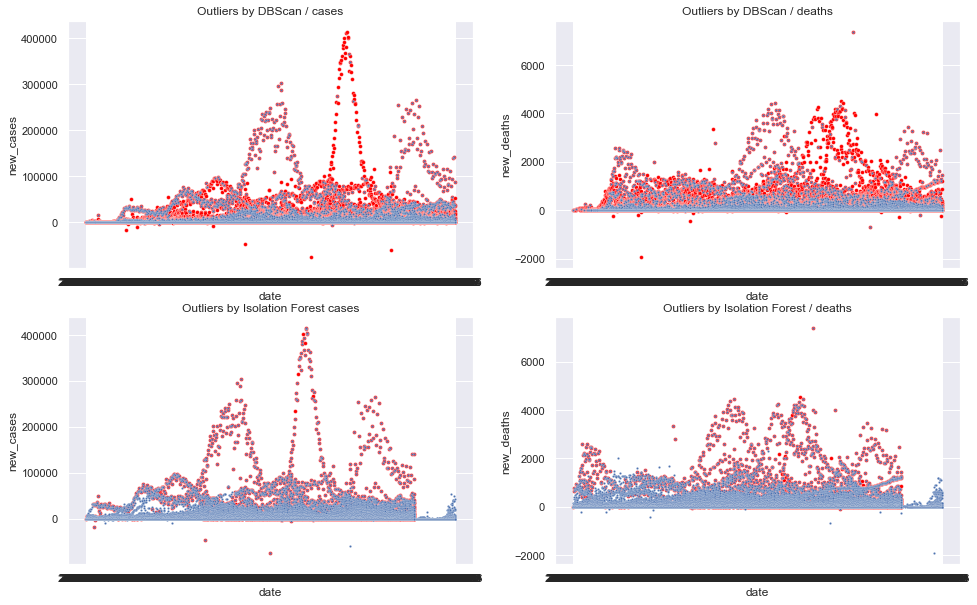

In [118]:
from sklearn.ensemble import IsolationForest


df_outlier_detection = df.drop(df.select_dtypes('object').columns.to_list(), axis=1)

for col in df_outlier_detection.columns : 
    df_outlier_detection[col].fillna(df_outlier_detection[col].mean(), inplace=True)

clf = IsolationForest(max_samples=100, random_state = 1, contamination= 'auto')
preds = clf.fit_predict(df_outlier_detection)
outliers2 = np.where(preds==-1)[0]



from sklearn.cluster import DBSCAN
outlier_detection = DBSCAN(min_samples = 2, eps = 3)
clusters = outlier_detection.fit_predict(df_outlier_detection)
outliers = np.where(clusters==-1)[0]


sns.set_theme()
f, axes = plt.subplots(2, 2, figsize=(16, 10))
axes[0][0].title.set_text('Outliers by DBScan / cases')
axes[1][0].title.set_text('Outliers by Isolation Forest cases')
axes[0][1].title.set_text('Outliers by DBScan / deaths')
axes[1][1].title.set_text('Outliers by Isolation Forest / deaths')

sns.scatterplot(data=df.iloc[outliers].sort_values('date'), x='date', y='new_cases', color='red', s=15, ax=axes[0][0])
sns.scatterplot(data=df[~df.index.isin(outliers)].sort_values('date'), x='date', y='new_cases', s=5, ax=axes[0][0])

sns.scatterplot(data=df.iloc[outliers2].sort_values('date'), x='date', y='new_cases', color='red', s=15, ax=axes[1][0])
sns.scatterplot(data=df[~df.index.isin(outliers2)].sort_values('date'), x='date', y='new_cases', s=5, ax=axes[1][0])

sns.scatterplot(data=df.iloc[outliers].sort_values('date'), x='date', y='new_deaths', color='red', s=15, ax=axes[0][1])
sns.scatterplot(data=df[~df.index.isin(outliers)].sort_values('date'), x='date', y='new_deaths', s=5, ax=axes[0][1])

sns.scatterplot(data=df.iloc[outliers2].sort_values('date'), x='date', y='new_deaths', color='red', s=15, ax=axes[1][1])
sns.scatterplot(data=df[~df.index.isin(outliers2)].sort_values('date'), x='date', y='new_deaths', s=5, ax=axes[1][1])



there are two algorithms I used to detect outliers, the red dots would show the outliers detected and the blue dots are non outliers, in both algorithms we see if we remove outliers we would have removed all the important data about how each country waved in their involement with COVID-19

# 2 - General outlooks.
we'll start by analyzing the total cases over the globe plus a more detailed visualization on 10-preselected countries


Bar Ones

In [9]:
selected_countries = ['United States', 'India', 'China', 'United Kingdom', 'Iran', 'France', 'Germany', 'Brazil', 'Russia']


def choropleth(coloring, range_color, title, h=600, w=1000, cmap='reds'):
    df.date = df.date.astype(str)
    fig = px.choropleth(df.fillna(0), locations='location',locationmode="country names",
                        color_continuous_scale=cmap,
                        animation_frame='date',
                        color=coloring,  
                        #projection="robinson",
                        range_color=range_color,
                        title=title)
    
    fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 1
    fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 1
    fig.update_layout(autosize=False, width=w, height=h, title_y=0.9, title_x=0.5)
    fig.show()



#choropleth('new_cases_per_million', (0, 400), 'new cases of each country per million person')
choropleth('new_cases', (0, 100000), 'new cases of each country over time')



what we see here is how each location's new cases diffrentiates from its previous day, this could show us the consistancy over growth of corona virus in different countries also we'll have the stringency index scaled to be seen in the plot(as it would be an important factor to the changes of new cases)

In [10]:
from plotly.subplots import make_subplots

gen_fig = make_subplots(rows=3, cols=3, shared_xaxes=False, subplot_titles=selected_countries)
colrow = [(1, 1), (1, 2), (1, 3), (2, 1), (2, 2), (2, 3), (3, 1), (3, 2), (3, 3)]

for index, country in enumerate(selected_countries) : 
    temp_df = df.groupby('location').get_group(country)
    mean_cases = temp_df.new_cases.mean()
    temp_df['new_cases_diff_smoothed'] = np.diff(df[df.location == country].new_cases_smoothed, prepend=0)
    fig1 = px.bar(temp_df, x='date', y='new_cases_diff_smoothed', color_discrete_sequence=px.colors.sequential.Blackbody, )
    fig1['data'][0].width = 0.2
    fig1['data'][0].marker.line.width = 0   

    scaler = temp_df['new_cases_diff_smoothed'].max() / temp_df['stringency_index'].max()
    fig2 = px.line(temp_df, x='date', y=temp_df['stringency_index'] * scaler, color_discrete_sequence=px.colors.sequential.Reds_r)

    trace1 = fig1['data'][0]
    trace2 = fig2['data'][0]

    gen_fig.add_trace(trace1, row=colrow[index][0], col=colrow[index][1])
    gen_fig.add_trace(trace2, row=colrow[index][0], col=colrow[index][1])
    


gen_fig.update_layout(
autosize=False,
width=1400,
height=700,
title_text='weekly differences of new cases, the line demonstrates the stringency index(scaled to be seen in the graph)'
)

gen_fig.show()



In [12]:
fig_whole = make_subplots(rows=2, cols=2, shared_xaxes=True, subplot_titles=['total_deaths', 'total_cases', 'new_cases_smoothed', 'new_deaths_smoothed'])

for coords, y in zip([(1, 1), (1, 2), (2, 1), (2, 2)], ['total_deaths', 'total_cases', 'new_cases_smoothed', 'new_deaths_smoothed']) : 
    fig = px.line(df[df.location.isin(selected_countries)].reset_index(), x='date', y=y, color='location')
    for i in range(len(fig['data'])) : 
        fig_whole.add_trace(fig['data'][i], row=coords[0], col=coords[1])

fig_whole.show()



here we try to visualize the recovery rate in each country though we cannot actually know the true numbers
and also we won't know each of new cases has cured or not, i did try a heatmap which does as follows : 
    it would shift the new_cases feature by 1 day, and this was done in a range of 1 to 14 days shift
    then i heatmapped it to see if any of the shifted features(eg shifted_new_cases_5) has a higher correlation to new_deaths features comparing to new_cases
    if there was a feature found that would have a higher correlation we could know the average delay it takes for the virus to kill someone
    hence using that feature to find the most recovies of each day in our data set, 

well unfortunately what i describe above failed to show us any meaningfull (and noticable diff in correlation) so i just used the total_cases - total_deaths as a recovery factor...

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
 
df['approximate_recoveries'] = df.total_cases - df.total_deaths
df['approximate_recoveries_per_million'] = df.total_cases_per_million - df.total_deaths_per_million


fig = make_subplots(rows=1, cols=2, specs = [[{'type': 'choropleth'},  {'type': 'choropleth'}]])


ddf = df.groupby('location')['approximate_recoveries', 'approximate_recoveries_per_million'].agg({'approximate_recoveries' : 'max', 'approximate_recoveries_per_million' : 'max'}).reset_index()


fig1 = go.Choropleth(
    locations=ddf.location,
    z = ddf.approximate_recoveries,
    locationmode = 'country names', # set of locations match entries in `locations`
    colorbar_title = "approximate recoveries over the globe", colorscale='tealgrn')

fig2 = go.Choropleth(
    locations=ddf.location,
    z = ddf.approximate_recoveries_per_million,
    locationmode = 'country names', # set of locations match entries in `locations`
    colorbar_title = "same but per mil", colorscale='tealgrn')



fig1['colorbar']['x'] =- 0.1
fig.add_trace(fig1, row=1, col=1)
fig.add_trace(fig2, row=1, col=2)
fig.update_layout(width=1400, height=500)
fig.show()




In [ ]:
df['mortality_rate'] = df.total_deaths / df.total_cases


df.date = pd.to_datetime(df.date, infer_datetime_format=True)

fig1 = px.line(df[df.location.isin(selected_countries)], x='date', y='mortality_rate', color='location', title='mortality rate of each country over time') 
fig1.show()
fig2 = px.scatter(df[df.location.isin(selected_countries)], x='date', y='excess_mortality', color='location', trendline="rolling", trendline_options=dict(window=1),
                  title='excess mortality of each country over time')
fig2.show()

In [ ]:
px.scatter(df.sort_values(['location', 'date']).ffill().fillna(0), x='total_deaths', 
           y='excess_mortality_cumulative_absolute', color='continent', animation_frame='date', 
           title='Excess Mortality vs Total Deaths', trendline="ols")

Vaccinations And Test


# 3 - How the waves hit the countries!
below we have used scipy library to find the oscillations over the crona-cases on some countries for this purpose the smoothed features are used which made the work a **lot easier**, also the wave counter was copied from this [link](https://stackoverflow.com/questions/63240486/count-waves-in-plot-using-python)

- its not working at the most accurate level but still can give us some insights of which countries have faced more waves of disease-spread
- later on we can try to make some sense over this feature and the stringency_index or population_density, etc...

In [ ]:
import numpy as np
from scipy.signal import find_peaks, find_peaks_cwt
import matplotlib.pyplot as plt


gen_fig = make_subplots(rows=2, cols=2, shared_xaxes=False, subplot_titles=('United States', 'Iran', 'China', 'Australia'))
colrow = [(1, 1), (1, 2), (2, 1), (2, 2)]


for index, country_to_show in enumerate(['United States', 'Iran', 'China', 'Australia']) : 
    y = df.groupby('location').get_group(country_to_show).new_cases_smoothed.fillna(0)
    peaks, _ = find_peaks(y, prominence=120, height= np.max(y)/100, distance=100)

    fig = px.scatter(x=df.groupby('location').get_group(country_to_show).date, y=df.groupby('location').get_group(country_to_show).new_cases_smoothed,
            color=df.groupby('location').get_group(country_to_show).stringency_index, title=country_to_show+"'s new cases on each time frame, the color shows strigency index",
            color_continuous_scale=px.colors.sequential.Viridis, color_continuous_midpoint=30)
    
    mean = int(df.groupby('location').get_group(country_to_show).new_cases.mean())
    fig.add_hline(y=mean, line_dash="dot",
                  annotation_text="Mean :"+str(mean),
                  annotation_position="bottom left")
    
    for i in range(len(peaks)) :     
        fig.add_vrect(x0=df.groupby('location').get_group(country_to_show).date.iloc[peaks[i]-5], 
                      x1=df.groupby('location').get_group(country_to_show).date.iloc[peaks[i]+5],
                      col=1,
                      annotation_text="wave "+str(i+1), annotation_position="top left",
                      fillcolor="pink", opacity=0.8, line_width=0)


    ############# this is not something you wonna do generally, the reason i did is that px doesnt support subplotting so i manually subplotted it
    trace = fig['data'][0]
    annots = fig['layout']['annotations']
    shapes = fig['layout']['shapes']

    gen_fig.add_trace(trace, row=colrow[index][0], col=colrow[index][1])
    for annot in annots : 
        gen_fig.add_annotation(annot, row=colrow[index][0], col=colrow[index][1])
    for shape in shapes : 
        gen_fig.add_shape(shape, row=colrow[index][0], col=colrow[index][1])


gen_fig.update_layout(
    autosize=False,
    width=1200,
    height=600,
    coloraxis_colorbar={'title':"Strigency Index"}
    )

gen_fig.show()

####################### Fix : merge the data into one df so you can facet it into subplots #################################

In [ ]:
############# scatter plot of the work new_cases #######################
fig = px.scatter(x=df_worldwide.groupby('location').get_group('World').date, 
                     y=df_worldwide.groupby('location').get_group('World').new_cases_smoothed,
                     color_discrete_sequence=['black'], 
                     title="Worldwide Waves (Line width is set regarding to the population) (Green:Asia  Yellow:Africa  Blue:Euorpe  Pink:NA  Red:SA)")
########################################################################


### personalization for each wave line #################################
loc_names = dict(zip(['Africa', 'Asia', 'Europe', 'North America', 'South America'], ['AF', 'AS', 'EU', 'nA', 'sA']))
loc_colors = dict(zip(['Africa', 'Asia', 'Europe', 'North America', 'South America'], ['orange', 'green', 'blue', 'magenta', 'red']))
loc_locs = dict(zip(['Africa', 'Asia', 'Europe', 'North America', 'South America'], ['top right', 'top left', 'bottom right', 'bottom left', 'bottom right']))
loc_sizes = dict(zip(['Africa', 'Asia', 'Europe', 'North America', 'South America'], [4, 5, 3, 2, 1]))
########################################################################


###################### ploting wave lines ##############################
for country_to_show in ['Africa', 'Asia', 'Europe', 'North America', 'South America'] : 
    y = df_worldwide.groupby('location').get_group(country_to_show).new_cases_smoothed.fillna(0)
    peaks, _ = find_peaks(y, prominence=120, height= np.max(y)/100, distance=100)
    for i in range(len(peaks)) : 
        fig.add_vrect(x0=df_worldwide.groupby('location').get_group(country_to_show).date.iloc[peaks[i]-loc_sizes[country_to_show]], 
                      x1=df_worldwide.groupby('location').get_group(country_to_show).date.iloc[peaks[i]+2],
                      col=1, fillcolor=loc_colors[country_to_show], opacity=.8, line_width=0)
    

fig.show()


a pararel coords work really good here. (last col could be exeess mortality as it has intuitive relations to total_cases)

# Part 2 

the country specefic features are listed below (with a few exceptions which contained a lot of null values): 

- human_development_index 
- life_expectancy
- handwashing_facilities
- diabetes_prevalence
- cardiovasc_death_rate
- extreme_poverty
- gdp_per_capita
- median_age
- population_density
- aged_70_older
- reproduction_rate
- excess_mortality

the process which yielded those features above was not mentioned here, simply groupby location and find the features who have unary uniques
(and of course we won't have enough time to look into each of them by detail but we'll try to do as many as we can)

we will also want to have total cases, deaths, and the the ratio of death per case in our new dataframe...

we will also use the wave counter we had above to add another feature

In [ ]:
## country specefic features :
df_specs = df.groupby('location')['human_development_index', 'life_expectancy', 'handwashing_facilities', 'diabetes_prevalence',
                                  'cardiovasc_death_rate', 'extreme_poverty', 'gdp_per_capita', 'median_age', 'population_density',
                                  'aged_70_older', 'aged_65_older', 'reproduction_rate', 'excess_mortality'].max()


## wave counting for each country : 
waves_for_each_country = []
for country in df_specs.index :
    y = df.groupby('location').get_group(country).new_cases_smoothed.fillna(0)
    peaks, _ = find_peaks(y, prominence=120, height= np.max(y)/100, distance=100)
    waves_for_each_country.append(len(peaks))
df_specs['number_of_waves'] = waves_for_each_country


## adding total deaths/cases and per mills of them plus a death/case ration
df_specs['total_cases'] = df.groupby('location')['total_cases'].max()
df_specs['total_deaths'] = df.groupby('location')['total_deaths'].max()
df_specs['total_cases_per_million'] = df.groupby('location')['total_cases_per_million'].max()
df_specs['total_deaths_per_million'] = df.groupby('location')['total_deaths_per_million'].max()
df_specs['death_case_ratio'] = df_specs['total_deaths'] / df_specs['total_cases'].fillna(1)

df_specs = df_specs.reset_index()

#df_specs.head()

Using a heat map could show us correlations between multiple features, we'll use the pre-selected features to see their correlations over all the locations on all time_stapms

In [ ]:
#px.colors.sequential.swatches()
###bug fix need to fix this shit, wrong diagonal axis, also we want corr[corr>0.5]
import plotly.figure_factory as ff

corr_map = (df_specs.drop(['total_cases', 'total_deaths'], axis=1).corr()*100).astype(int)/100
fig = ff.create_annotated_heatmap(np.array(corr_map), x=corr_map.index.tolist(), y=corr_map.columns.tolist(),
                                  colorscale='tealrose_r')
fig.show()

Using a parallel coordinates plot has the same purpose of finding relations between multiple features, the same could be dont with a simple lineplot plot, though using paralel_coordiantes plot gives us a normalized/percentage based view over the features which line plot cannot(e.g. if a features range is 0 to 1mil it will shut down all the other faetures with narrower ranges hence overshadowing all)

In [137]:
df_paral = df.groupby('location').agg({'continent':'first', 'human_development_index':'first', 'life_expectancy':'first', 'handwashing_facilities':'first', 
                                       'diabetes_prevalence':'first','cardiovasc_death_rate':'first', 'extreme_poverty':'first', 'gdp_per_capita':'first', 
                                       'excess_mortality':'first'})

df_paral = df_paral.reset_index().drop('location', axis=1).sort_values(by='continent')

In [140]:
le.classes_

array(['Africa', 'Asia', 'Europe', 'North America', 'Oceania',
       'South America'], dtype=object)

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(df_paral.continent)
df_paral['continent_id'] = le.transform(df_paral.continent)


#df_binned = Auto_binner(df_specs)
fig = px.parallel_coordinates(df_paral, color='continent_id', 
                              color_continuous_scale=px.colors.diverging.Tealrose,)
fig.update_layout(width=1200)
fig.show()



# Vaccinations 
here we'll see how the vaccination speed progressed as the new_cases increased in number overtime

In [ ]:
df.date = df.date.astype(str)
x = 'total_cases_per_million'
y = 'people_vaccinated_per_hundred'
x_min = df[x].min()
x_max = df[x].max()
y_min = df[y].min()
y_max = df[y].max()

fig = px.scatter(df[df.date>'2020-12-10'], x=x, y=y, animation_frame='date', text='location', range_x=(x_min, x_max), range_y=(y_min, y_max), color='continent')
fig.update_layout(title='Progression of vaccination over total_cases', height=700)
fig.show()

In [ ]:
df_vac = pd.pivot(df, index='date', columns="location", values="people_vaccinated_per_hundred").ffill().fillna(0).reset_index()
df_vac = pd.melt(df_vac, 
            id_vars='date', 
            value_vars=list(df_vac.columns[1:]),
            var_name='location', 
            value_name='vacs_percent')


df_vac = df_vac[df_vac.location.isin(selected_countries)]
fig=px.bar(df_vac[df_vac.date >= '2020-12-10'], x='vacs_percent', y='location', 
        orientation='h', animation_frame='date', range_x=(0, 100), text='vacs_percent', )

fig.update_layout(barmode='stack', title='Percentage of people who got fully vaccinated')
fig.show()

In [ ]:
import plotly.express as px
import numpy as np

new_df = df.groupby('location').last().reset_index().rename({'location' : 'country'}, axis=1)

fig = px.treemap(new_df, path=[px.Constant('world'), 'continent', 'country'], values='population',
                  color='total_vaccinations_per_hundred', range_color=(0, 150))
fig.show()


fig = px.sunburst(new_df, path=['continent', 'country'], values='population',
                  color='people_fully_vaccinated_per_hundred',  color_continuous_midpoint=10)
fig.show()

In [ ]:
# df_world['low income', 'high income'] what are they ?
# why china did it so good ? 